# Blueprint of the models

This notebook contains the code to generate the plots:

    1- Supplemental Figure 4
    2- Figure 2a, b 

In [1]:
%load_ext autoreload
%autoreload 2

## Upload dependencies from scripts

In [2]:
import os
import glob
import pandas as pd
import sys

from math import pi
from itertools import compress

def config_params(font_size=12):
    mpl.rcParams.update(mpl.rcParamsDefault)
    plt.rcParams['font.sans-serif'] = ['arial']
    plt.rcParams['font.size'] = font_size
    plt.rcParams['font.family'] = ['sans-serif']
    plt.rcParams['svg.fonttype'] = 'none'
    plt.rcParams['mathtext.fontset'] = 'custom'
    plt.rcParams['mathtext.cal'] = 'arial'
    plt.rcParams['mathtext.rm'] = 'arial'
    
pd.options.display.max_columns = 60

import matplotlib as mpl
mpl.rcParams['figure.dpi']= 200

import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

In [3]:
output_boostdm = '/workspace/projects/boostdm_ch/output/run_20230802_includeLowQuality'


# Upload mutations
def get_mutations():
    obs_mut = pd.read_csv(os.path.join(output_boostdm, 'discovery', 'mutations.tsv'), sep='\t')
    obs_mut.rename(columns={'mut': 'alt'}, inplace=True)
    obs_mut['chr'] = obs_mut['chr'].astype(str)
    obs_mut['pos'] = obs_mut['pos'].astype(int)
    return obs_mut

# Get observed mutations (training set)
obs_muts = get_mutations()
print(len(obs_muts))
obs_muts.columns

438010


Index(['sampleID', 'chr', 'pos', 'ref', 'alt', 'gene', 'strand', 'ref_cod',
       'mut_cod', 'ref3_cod', 'mut3_cod', 'aachange', 'ntchange', 'codonsub',
       'impact', 'pid', 'COHORT'],
      dtype='object')

## 1. Supplemental Figure 4

In [4]:
# List all the prediction outputs from BoostDM-CH
path_saturation = '../../Paper_data/BoostDM-CH/prediction/'
prediction_paths = list(glob.glob(os.path.join('../../Paper_data/BoostDM-CH/prediction/', 
                                               '*.*.prediction.tsv.gz')))
prediction_paths[0]

'../../Paper_data/BoostDM-CH/prediction/IDH2.CH.prediction.tsv.gz'

In [5]:
## Upload dependencies and functions

PFAM_files = os.path.join('../../Paper_data/pfam/pfam_biomart.tsv.gz')
PFAM_info = os.path.join('../../Paper_data/pfam/pfam_names.info.csv')
# CDS coordinates
path_coord = os.path.join('../../Paper_data/pfam/cds_biomart.tsv')

from collections import defaultdict
import numpy as np
import pandas as pd
import scipy.stats
from matplotlib import gridspec
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib import cm


cmap = cm.get_cmap('tab10')
# colors = [cmap(0), cmap(1), cmap(2), cmap(3), cmap(4), cmap(5), cmap(6), cmap(7), cmap(8), cmap(9)]
colors = ['#3a5a40', cmap(2), cmap(1), cmap(6), cmap(4), cmap(5), '#0077b6', '#03045e', '#00b4d8', '#90e0ef']

alphas = [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]

names = {'HotMaps_cat_1': '3D cluster',
         'CLUSTL_cat_1': 'Linear cluster',
         'smRegions_cat_1': 'PFAM Domain',
         'PhyloP': 'Conservation',
         'PTM': 'PTM',
         'nmd': 'NMD',
         'csqn_type_missense': 'Missense',
         'csqn_type_nonsense': 'Nonsense',
         'csqn_type_splicing': 'Splicing'}

def get_PFAMs_per_transcript(PFAM_files, PFAM_info, transcript):
    df_pfam = pd.read_csv(PFAM_files, sep="\t", names=["ENSEMBL_GENE", "ENSEMBL_TRANSCRIPT", "START", "END", "DOMAIN"])
    df_names = pd.read_csv(PFAM_info, sep="\t", names=["DOMAIN", "CLAN", "CLAN_NAME", "DOMAIN_NAME", "Long Name"])

    # Get domains
    df_pfam_gene = df_pfam[(df_pfam["ENSEMBL_TRANSCRIPT"] == transcript)]
    df_pfam_gene = df_pfam_gene[["ENSEMBL_TRANSCRIPT", "START", "END", "DOMAIN"]].drop_duplicates()
    df_pfam_gene = pd.merge(df_pfam_gene, df_names[["DOMAIN", "DOMAIN_NAME"]].drop_duplicates(), how="left")
    if df_pfam_gene.shape[0] > 0:
        df_pfam_gene["POS"] = df_pfam_gene.apply(lambda row: row["START"] + ((row["END"] - row["START"]) // 2), axis=1)
        df_pfam_gene["SIZE"] = df_pfam_gene.apply(lambda row: row["END"] - row["START"] + 1, axis=1)
        df_pfam_gene["Color"] = "#808080ff"  # color Pfam domain

    return df_pfam_gene


"""Fetch mutations"""


def get_position(row):
    try:
        v = int("".join(row["aachange"][1:-1]))
        return v
    except Exception:
        return -1
       

def load_saturation_all(gene, model, base_path, shap_corrected=True):

    path_file = os.path.join(base_path, f'{gene}.{model}.prediction.tsv.gz')
    if os.path.exists(path_file):
        df = pd.read_csv(path_file, sep="\t")
        df.drop_duplicates(inplace=True)
        df["Protein_position"] = df.apply(lambda row: get_position(row), axis=1)

        # TODO: aggregate all the PTM types (do an OR of the various PTMs)
        df["PTM"] = df.apply(lambda r: max(r['Phosphorylation'],
                                           r['Acetylation'],
                                           r['Methylation'],
                                           r['Ubiquitination'],
                                           r['Regulatory_Site']), axis=1)

        # summary to codon level
        df = df[~df['aachange'].isnull()]
        if len(df) > 0:
            df["AA"] = df.apply(lambda row: row["aachange"][0], axis=1)
            df3 = df.groupby(["AA", "Protein_position", "ENSEMBL_TRANSCRIPT"],
                             as_index=False).agg(
                                {
                                    "boostDM_score": list,
                                    "csqn_type_missense": list,
                                    "csqn_type_nonsense": list,
                                    "csqn_type_splicing": list,
                                    "nmd": np.nanmax,                                    
                                    "HotMaps_cat_1": np.nanmax,
                                    "smRegions_cat_1": np.nanmax,
                                    "CLUSTL_cat_1": np.nanmax,
                                    "PhyloP": np.nanmean,
                                    "PTM": np.nanmax,
                                })
            
            df3["gene"] = gene
            df3["cancer_type_annotations"] = 'CH'
            df3.sort_values(by='Protein_position', ascending=True, inplace=True)
            df3.reset_index(inplace=True)
            return df3
    
    print(f"file {path_file} not found...")
    return pd.DataFrame([])

def plot_codon_bands(df_pfam_gene, df, ax_0, ax_2, ax_4):

    ax_0.set_ylabel("boostDM-CH score", fontsize=6)
    ax_0.set_xticks(np.linspace(0, 1, 3))
    ax_0.spines['bottom'].set_visible(False)
    ax_0.spines['left'].set_linewidth(1)
    ax_0.spines['right'].set_visible(False)
    ax_0.spines['top'].set_visible(False)

    # set equivalent coordinates for the three possible mutations
    prot_pos = list(df.Protein_position)
    
    # retrieve values
    d = df["boostDM_score"].values
    csqn_type_miss  = df["csqn_type_missense"].values 
    csqn_type_non   = df["csqn_type_nonsense"].values

    passenger_x, passenger_y, passenger_color = [], [], []
    driver_x, driver_y, driver_color = [], [], []
#     dic_scores_pos = defaultdict(list)

    # for each of the positions
    for i, p in enumerate(prot_pos):
        for j, score in enumerate(d[i]):
            
            if score < 0.5:
                passenger_x.append(p)
                passenger_y.append(score)
                passenger_color.append('#636363')
            else:
                driver_x.append(p)
                driver_y.append(score)
                driver_color.append('#800000')

    size = 1
    ax_0.scatter(passenger_x, passenger_y, s=size+2, c=passenger_color, alpha=0.1)
    ax_0.scatter(driver_x, driver_y, s=size+2, c=driver_color, alpha=0.1)
    ax_0.set_xticks([])
    ax_0.set_xlim(0, len(prot_pos))
    
    driver_score = []
    for aa, bDMscore in zip(df['Protein_position'], df['boostDM_score']):
        driver_score = driver_score+len([1 for x in bDMscore if float(x)>0.5])*[aa]
    
    miss_high_score = []
    for aa, bDMscore, ttype in zip(df['Protein_position'], df['boostDM_score'], df['csqn_type_missense']):
        ttype_score = [float(a)*float(b) for a,b in zip(bDMscore,ttype)]
        miss_high_score = miss_high_score+len([1 for x in ttype_score if float(x)>=0.9])*[aa]
    
    miss_low_score = []
    for aa, bDMscore, ttype in zip(df['Protein_position'], df['boostDM_score'], df['csqn_type_missense']):
        ttype_score = [float(a)*float(b) for a,b in zip(bDMscore,ttype)]
        miss_low_score = miss_low_score+len([1 for x in ttype_score if float(x)>=0.5 and float(x)<0.9])*[aa]

    non_high_score = []
    for aa, bDMscore, ttype in zip(df['Protein_position'], df['boostDM_score'], df['csqn_type_nonsense']):
        ttype_score = [float(a)*float(b) for a,b in zip(bDMscore,ttype)]
        non_high_score = non_high_score+len([1 for x in ttype_score if float(x)>=0.9])*[aa]
        
    non_low_score = []
    for aa, bDMscore, ttype in zip(df['Protein_position'], df['boostDM_score'], df['csqn_type_nonsense']):
        ttype_score = [float(a)*float(b) for a,b in zip(bDMscore,ttype)]
        non_low_score = non_low_score+len([1 for x in ttype_score if float(x)>=0.5 and float(x)<0.9])*[aa]

    ax_2.plot(driver_score, np.full_like(driver_score,5), '|k', markeredgewidth=0.2, markersize=6, color='#800000')
    ax_2.plot(miss_high_score, np.full_like(miss_high_score,4), '|k', markeredgewidth=0.2, markersize=6, color='#C17E14')
    ax_2.plot(miss_low_score, np.full_like(miss_low_score,3), '|k', markeredgewidth=0.2, markersize=6, color='#C17E14')
    ax_2.plot(non_high_score, np.full_like(non_high_score,2), '|k', markeredgewidth=0.2,  markersize=6, color='#C17E14')
    ax_2.plot(non_low_score, np.full_like(non_low_score,1), '|k', markeredgewidth=0.2,  markersize=6, color='#C17E14')

    # First number is the number of tiers that you have
    ax_2.set_yticks([1, 2, 3, 4, 5])
    ax_2.set_yticklabels(['Other', 'High-conf', 'Other', 'High-conf', 'Drivers'], fontsize = 6)
    ax_2.set_ylim(.5, 5.5)
    ax_2.set_xlim(0, max(df['Protein_position']))
    ax_2.set_xticks([])
    ax_2.spines['bottom'].set_visible(False)
    ax_2.spines['left'].set_linewidth(1)
    ax_2.spines['right'].set_visible(False)
    ax_2.spines['top'].set_linewidth(1)

    ax_4.set_ylim(0, 1)
    d = df["boostDM_score"].values

    for i, r in df_pfam_gene.iterrows():
        start_base = r['START']
        size_base = r['SIZE']
        rect = patches.Rectangle(xy=(start_base, 0), width=size_base, height=5, color=r["Color"], alpha=0.5, zorder=2)
        ax_4.annotate(text=r["DOMAIN_NAME"], xy=(start_base + size_base/3, 0.3), fontsize=5)
        ax_4.add_patch(rect)
       
        
    ax_4.set_xticks(np.append(np.arange(0, max(prot_pos), 100)[:-1], max(prot_pos)))
    ax_4.set_xticklabels(np.append(np.arange(0, max(prot_pos), 100)[:-1], max(prot_pos)), fontsize = 6)
    ax_4.set_xlim(min(prot_pos), max(prot_pos))
    ax_4.set_yticks([])
    ax_4.tick_params(axis='x', which='major', pad=3)

    ax_0.set_yticks([0, 0.5, 1])
    ax_0.set_yticklabels([0, 0.5, 1], size=6)

In [6]:
def tracked_blueprint_all(gene, df_codon, show=False):
    wanted_df = df_codon[(df_codon['gene'] == gene)]

    for transcript, gene in wanted_df[["ENSEMBL_TRANSCRIPT", "gene"]].drop_duplicates().values:

        # get PFAM domains and subset the mutation data
        subset_data_pfam = get_PFAMs_per_transcript(PFAM_files, PFAM_info, transcript)

        subset_data_muts = df_codon[
            (df_codon["ENSEMBL_TRANSCRIPT"] == transcript)].sort_values(by='Protein_position', ascending=True)

        # define figure layout
        fig = plt.figure(figsize=(8, 4))

        # grid layout
        gs = gridspec.GridSpec(26, 13, figure=fig)

        border = -(len(names) + 1)  # bottom limit for blueprint scatter
        # define subplots space
        ax1 = plt.subplot(gs[:border-8, :12])
        ax3 = plt.subplot(gs[border-8:border-2, :12])
        ax5 = plt.subplot(gs[border-2:border-1, :12])

        axes = []
        for i, track in enumerate(names):
            axes.append(plt.subplot(gs[border+i+1, :12], sharex=ax1))
        
        # plot scatterplot, driver tracks and protein body
        plot_codon_bands(subset_data_pfam, subset_data_muts, ax1, ax3, ax5)

        # plot features tracks
        for i, track in enumerate(names):
            color = colors[i]
            alpha = alphas[i]
            if track not in ['csqn_type_missense', 'csqn_type_nonsense', 'csqn_type_splicing', 'csqn_type_synonymous']:
                axes[i].plot(subset_data_muts[track].values, color=color, alpha=alpha, lw=0.5)
            else:
                datavector = np.array(list(map(np.mean, subset_data_muts[track].values)))
                axes[i].plot(datavector, color=color, alpha=alpha, lw=0.5)

            axes[i].spines['bottom'].set_visible(False)
            axes[i].spines['left'].set_linewidth(1)
            axes[i].spines['right'].set_visible(False)
            axes[i].spines['top'].set_visible(False)
            axes[i].set_yticks([])
            axes[i].set_xticks([])

            axes[i].set_ylabel(names[track], rotation=0, labelpad=8, fontsize=6, color=color,
                               horizontalalignment='right', verticalalignment='center')
        

        ax1.set_title(f'{gene}', fontsize=10)
        plt.show()


In [12]:
def plot_blueprint_all(gene, model):
    df_codon = load_saturation_all(gene, model, path_saturation, shap_corrected=False)
    tracked_blueprint_all(gene, df_codon, show=True)
    mpl.rcParams['figure.dpi']= 600
    plt.show()

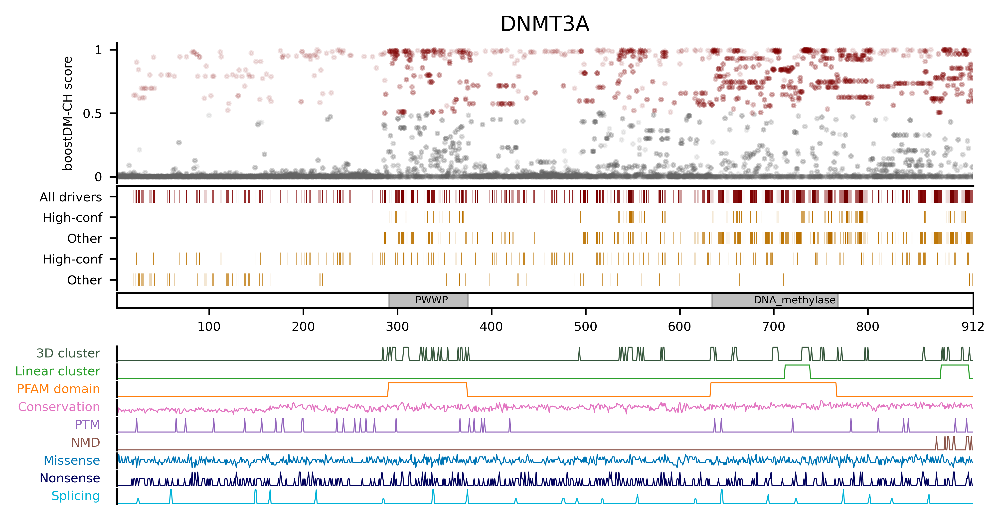

In [14]:
plot_blueprint_all('DNMT3A', 'CH')

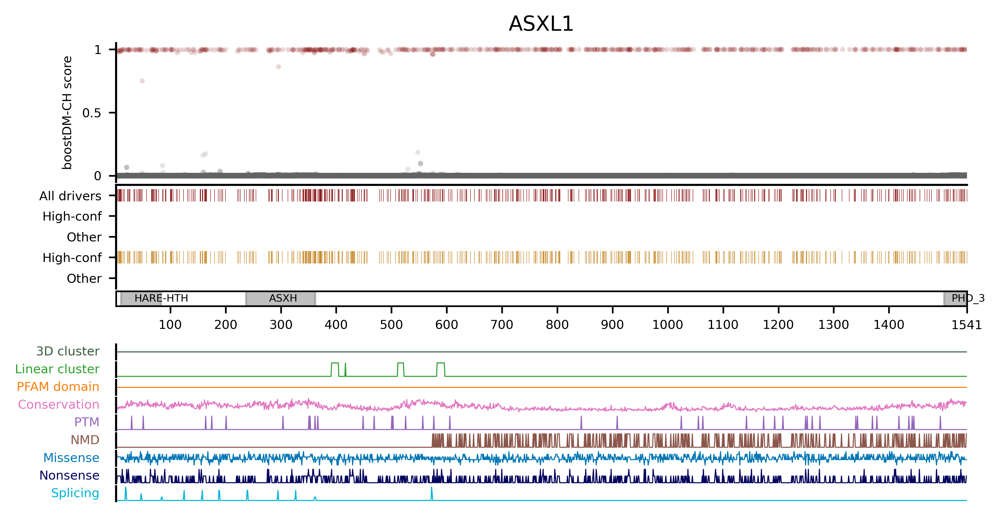

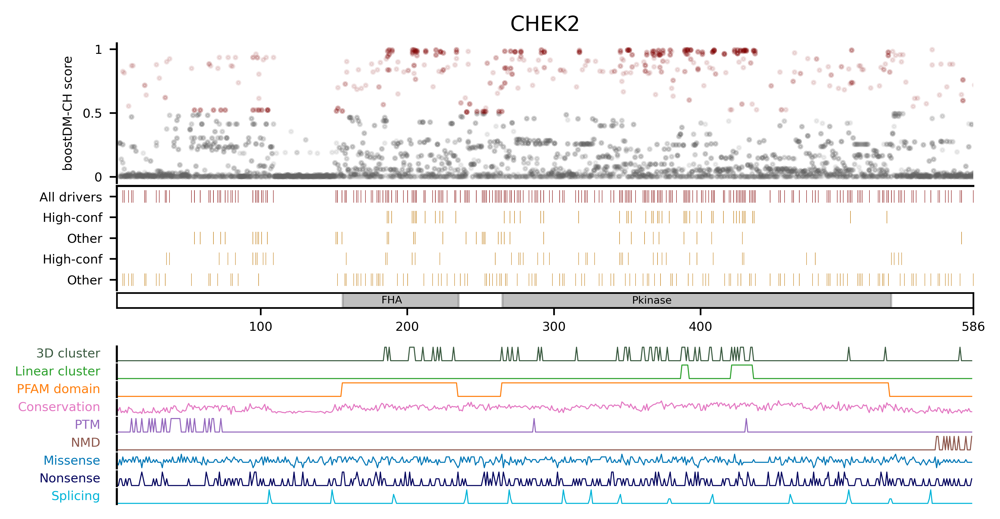

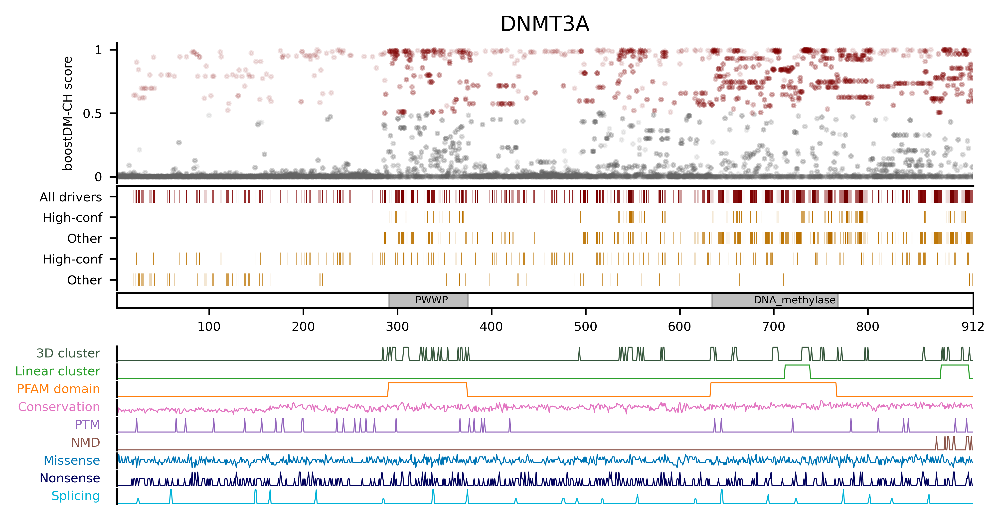

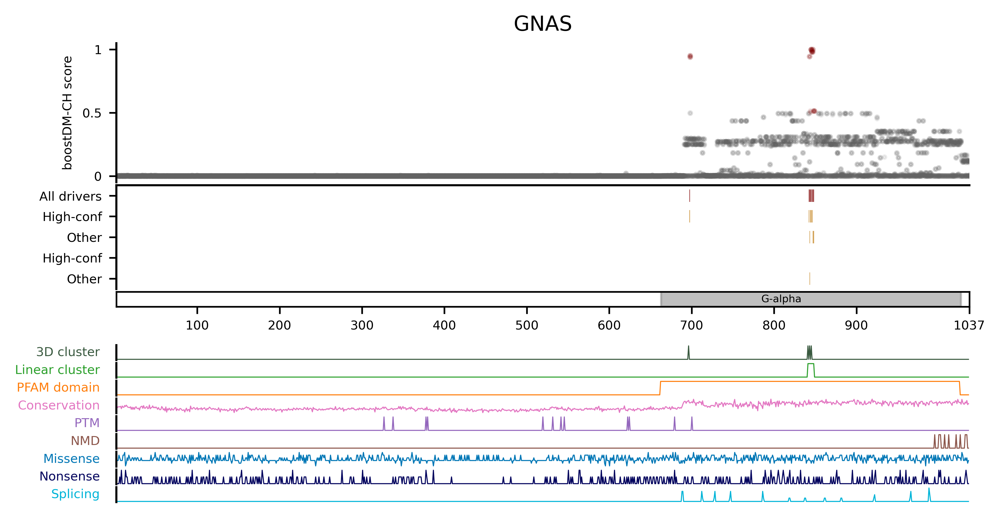

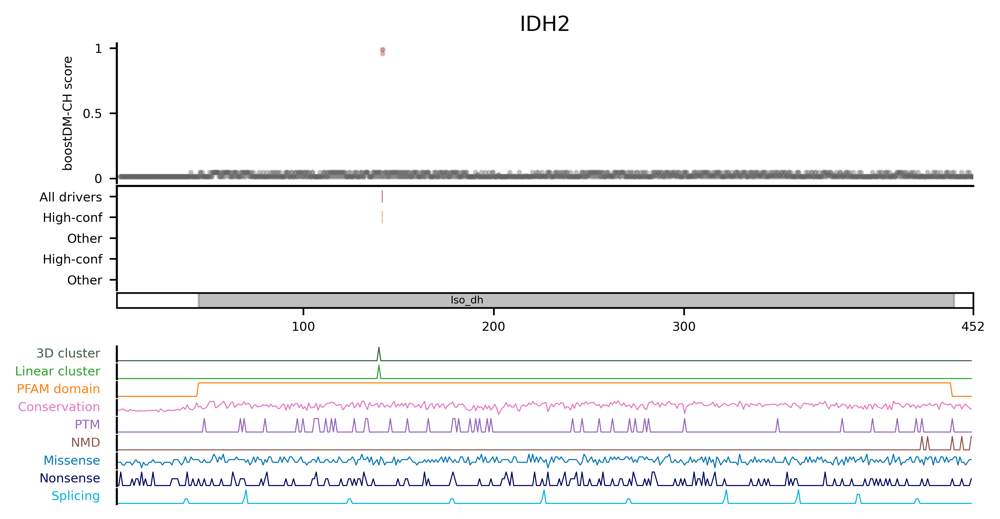

...

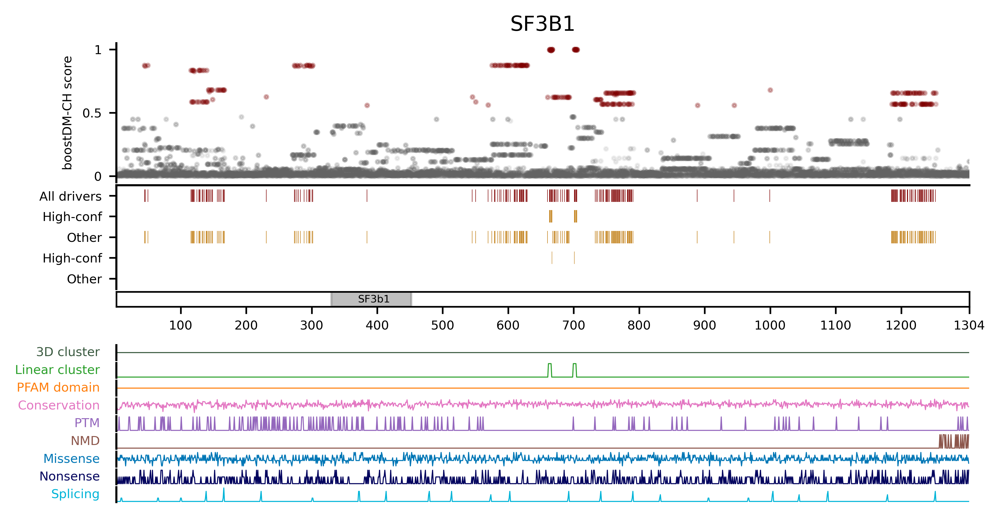

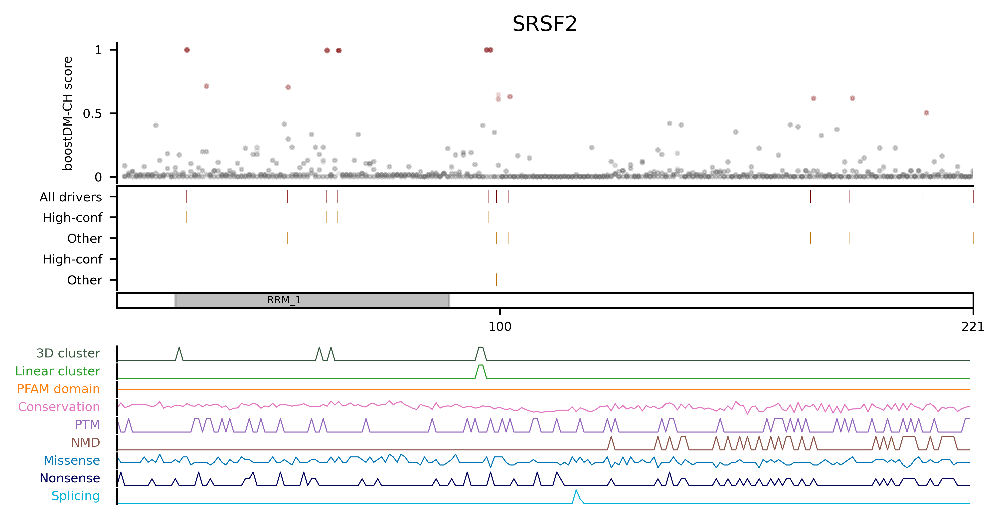

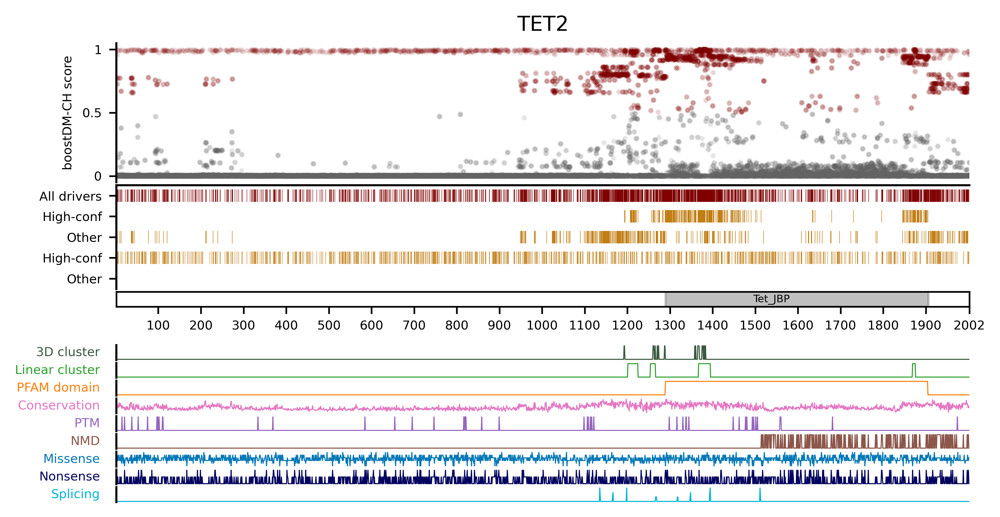

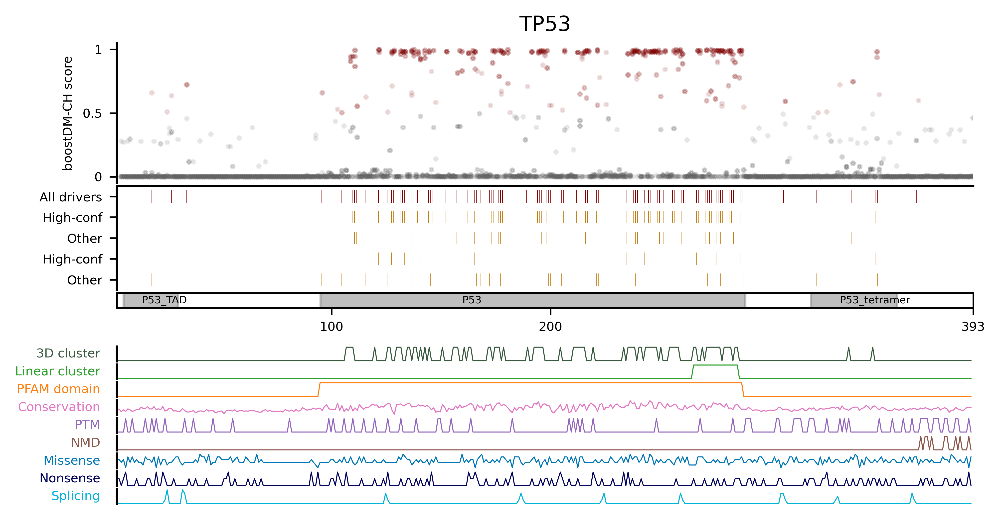

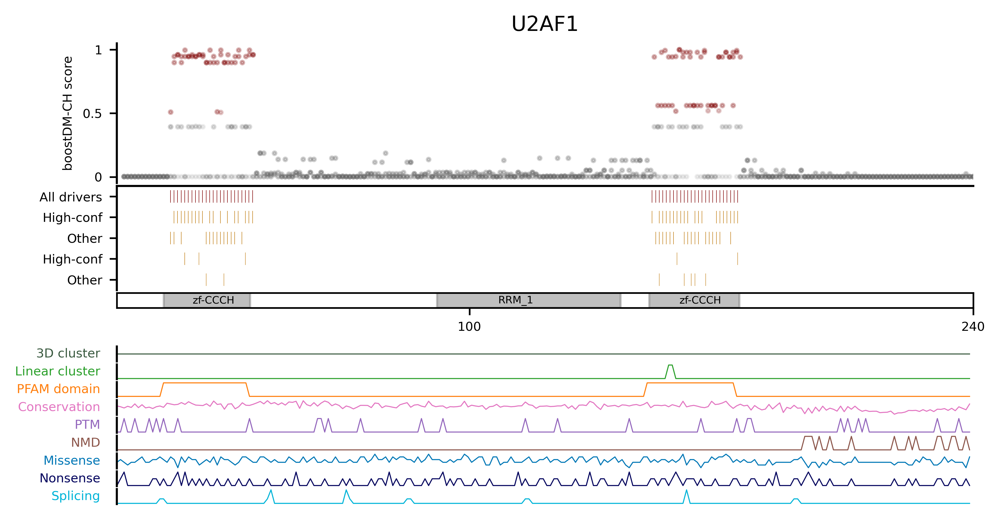

In [15]:
# Blueprints 12 genes
genes12 = ['ASXL1', 'CHEK2', 'DNMT3A', 'GNAS', 'IDH2', 'MDM4', 'PPM1D', 'SF3B1', 'SRSF2', 'TET2', 'TP53', 'U2AF1']

### Get paths of the prediction of the 12 genes
prediction_paths_12genes = []
for i in prediction_paths:
    if i.split('/')[-1].split('.')[0] in genes12:
        prediction_paths_12genes.append(i)
        

for gene in genes12:
    plot_blueprint_all(gene, 'CH')

## 2. Figure 2a, b

In [16]:
from collections import defaultdict
import numpy as np
import pandas as pd
import scipy.stats
from matplotlib import gridspec
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib import cm
from matplotlib import collections as mc


cmap = cm.get_cmap('tab10')
# colors = [cmap(0), cmap(1), cmap(2), cmap(3), cmap(4), cmap(5), cmap(6), cmap(7), cmap(8), cmap(9)]
colors = ['#3a5a40', cmap(2), cmap(1), cmap(6), cmap(4), cmap(5), '#0077b6', '#03045e', '#00b4d8', '#90e0ef']

alphas = [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]

names = {'HotMaps_cat_1': '3D cluster',
         'CLUSTL_cat_1': 'Linear cluster',
         'smRegions_cat_1': 'PFAM domain',
         'PhyloP': 'Conservation',
         'PTM': 'PTM',
         'nmd': 'NMD',
         'csqn_type_missense': 'Missense',
         'csqn_type_nonsense': 'Nonsense',
         'csqn_type_splicing': 'Splicing'}

def get_PFAMs_per_transcript(PFAM_files, PFAM_info, transcript):
    df_pfam = pd.read_csv(PFAM_files, sep="\t", names=["ENSEMBL_GENE", "ENSEMBL_TRANSCRIPT", "START", "END", "DOMAIN"])
    df_names = pd.read_csv(PFAM_info, sep="\t", names=["DOMAIN", "CLAN", "CLAN_NAME", "DOMAIN_NAME", "Long Name"])

    # Get domains
    df_pfam_gene = df_pfam[(df_pfam["ENSEMBL_TRANSCRIPT"] == transcript)]
    df_pfam_gene = df_pfam_gene[["ENSEMBL_TRANSCRIPT", "START", "END", "DOMAIN"]].drop_duplicates()
    df_pfam_gene = pd.merge(df_pfam_gene, df_names[["DOMAIN", "DOMAIN_NAME"]].drop_duplicates(), how="left")
    if df_pfam_gene.shape[0] > 0:
        df_pfam_gene["POS"] = df_pfam_gene.apply(lambda row: row["START"] + ((row["END"] - row["START"]) // 2), axis=1)
        df_pfam_gene["SIZE"] = df_pfam_gene.apply(lambda row: row["END"] - row["START"] + 1, axis=1)
        df_pfam_gene["Color"] = "#808080ff"  # color Pfam domain

    return df_pfam_gene


"""Fetch mutations"""


def get_position(row):
    try:
        v = int("".join(row["aachange"][1:-1]))
        return v
    except Exception:
        return -1
    
    
def create_observed_dataset(prediction_path, gene, cohort, obs_mut):

    sat_pred = pd.read_csv(prediction_path, sep='\t')
    sat_pred['chr'] = sat_pred['chr'].astype(str)
    sat_pred['pos'] = sat_pred['pos'].astype(int)
    # ! SDM CHANGE
    # Original: obs_mut = obs_mut[(obs_mut['gene'] == gene) & (obs_mut['COHORT'] == cohort)]
    obs_mut = obs_mut[obs_mut['gene'] == gene]
    df = obs_mut.merge(sat_pred, on=['gene', 'chr', 'pos', 'alt', 'aachange'], how='left')
    df.rename(columns={"COHORT": "cancer_type"}, inplace=True)
    df = df[~df['boostDM_class'].isnull()]
    return df


def load_saturation_all(gene, model, base_path, shap_corrected=True):

    path_file = os.path.join(base_path, f'{gene}.{model}.prediction.tsv.gz')
    if os.path.exists(path_file):
        df = pd.read_csv(path_file, sep="\t")
        df.drop_duplicates(inplace=True)
        df["Protein_position"] = df.apply(lambda row: get_position(row), axis=1)

        # TODO: aggregate all the PTM types (do an OR of the various PTMs)
        df["PTM"] = df.apply(lambda r: max(r['Phosphorylation'],
                                           r['Acetylation'],
                                           r['Methylation'],
                                           r['Ubiquitination'],
                                           r['Regulatory_Site']), axis=1)

     
        # summary to codon level
        df = df[~df['aachange'].isnull()]
        if len(df) > 0:
            df["AA"] = df.apply(lambda row: row["aachange"][0], axis=1)
            df3 = df.groupby(["AA", "Protein_position", "ENSEMBL_TRANSCRIPT"],
                             as_index=False).agg(
                                {
                                    "boostDM_score": list,
                                    "csqn_type_missense": list,
                                    "csqn_type_nonsense": list,
                                    "csqn_type_splicing": list,
                                    "csqn_type_synonymous": list,
                                    "nmd": np.nanmax,                                    
                                    "HotMaps_cat_1": np.nanmax,
                                    "smRegions_cat_1": np.nanmax,
                                    "CLUSTL_cat_1": np.nanmax,
                                    "PhyloP": np.nanmean,
                                    "PTM": np.nanmax,
                                })
            
            df3["gene"] = gene
            df3["cancer_type_annotations"] = 'CH'
            df3.sort_values(by='Protein_position', ascending=True, inplace=True)
            df3.reset_index(inplace=True)
            return df3
    
    print(f"file {path_file} not found...")
    return pd.DataFrame([])

def get_positions_in_CDS(transcript, path_coord):
    df = pd.read_csv(path_coord, sep='\t', low_memory=False,
                     names=['gene', 'gene_symbol', 'prot', 'chr', 's', 'e', 'aa', 'cds', 'genpos',
                            'strand', 'transcript'])

    toappend = []
    strand = ''
    for i, row in df[df['transcript'] == transcript].sort_values(by='s').iterrows():
        toappend.extend([i for i in range(row['s'], row['e'] + 1)])
        strand = row['strand']
    if strand == -1:
        toappend = toappend[::-1]

    return toappend


def get_plot_data_joanen(data):

    data["Protein_position"] = data.apply(lambda row: get_position(row), axis=1)
    data["AA"] = data.apply(lambda row: row["aachange"][0], axis=1)
    data['ID'] = data.apply(lambda x: '{}_{}'.format(x['pos'], x['alt']), axis=1)
    #We excluded the cancer_type in the operation of gruping because otherwise we were separating mutations in terms of the cohort.
    data = data.groupby(["ID", "pos", "AA", "Protein_position", "gene", "ENSEMBL_TRANSCRIPT", "boostDM_score", "boostDM_class"], as_index=False).agg({"sampleID": "count"})
    data.rename(columns={"sampleID": "number_observed_muts"}, inplace=True)

    return data

def plot_gene_full_nucleotide(data, transcript, path_coord, sat_pred, ax0, all_possible=False):

    # remove those mutations not falling in CDS:
    df = data[data['AA'] != 'n']

    # Configure the axis
    ax0.set_title('Observed mutations (n='+str(data['number_observed_muts'].sum())+')',  fontsize=6)
    ax0.set_ylabel("mutation count",  fontsize=6,  labelpad=3)

    ax0.spines['bottom'].set_linewidth(1)
    ax0.spines['left'].set_linewidth(1)
    ax0.spines['right'].set_visible(False)
    ax0.spines['top'].set_visible(False)
    ax0.tick_params(axis='y', labelsize=6, pad=3.5, width=0.75, length=3.5)
    ax0.tick_params(axis='x', length=0)
    ax0.set_xticks([])

   
    # set equivalent coordinates for the three possible mutations
    prot_pos = list(df.Protein_position)
    ys = df["number_observed_muts"].values
    d = df["boostDM_score"].values

    coordinates_mutations = []

    passenger_x = []
    passenger_y = []
    passenger_color = []

    driver_x = []
    driver_y = []
    driver_color = []

    # for each of the positions
    for i, p in enumerate(prot_pos):
        if ys[i] > 0:

            coordinates_mutations.append([(p, 0), (p, ys[i] - 0.1)])

            if d[i] < 0.5:

                passenger_x.append(p)
                if all_possible:
                    passenger_y.append(d[i])
                else:
                    passenger_y.append(ys[i])
                passenger_color.append('#636363')

            else:
                driver_x.append(p)
                if all_possible:
                    driver_y.append(d[i])
                else:
                    driver_y.append(ys[i])
                driver_color.append('#ac0f0f')

    lc = mc.LineCollection(coordinates_mutations, colors='black', linewidths=1, alpha=0.3)
    ax0.add_collection(lc)

    size = 12
    ax0.scatter(passenger_x, passenger_y, s=size, c=passenger_color, alpha=0.7, label='non-driver')
    ax0.scatter(driver_x, driver_y, s=size, c=driver_color, alpha=0.7, label='driver')

    leg = ax0.legend(loc='upper left', prop=dict(size=6))
    leg.get_frame().set_linewidth(0.0)
    ax0.set_xlim(0, max(sat_pred['Protein_position']))


def plot_codon_bands(df_pfam_gene, df, ax_0, ax_2, ax_4):

    ax_0.set_ylabel("boostDM-CH score", fontsize=6)
    ax_0.set_xticks(np.linspace(0, 1, 3))
    ax_0.spines['bottom'].set_visible(False)
    ax_0.spines['left'].set_linewidth(1)
    ax_0.spines['right'].set_visible(False)
    ax_0.spines['top'].set_visible(False)

    # set equivalent coordinates for the three possible mutations
    prot_pos = list(df.Protein_position)
    
    # retrieve values
    d = df["boostDM_score"].values
    csqn_type_miss  = df["csqn_type_missense"].values 
    csqn_type_non   = df["csqn_type_nonsense"].values

    passenger_x, passenger_y, passenger_color = [], [], []
    driver_x, driver_y, driver_color = [], [], []

    # for each of the positions
    for i, p in enumerate(prot_pos):
        for j, score in enumerate(d[i]):
            
            if score < 0.5:
                passenger_x.append(p)
                passenger_y.append(score)
                passenger_color.append('#636363')
            else:
                driver_x.append(p)
                driver_y.append(score)
                driver_color.append('#800000')

    size = 1
    ax_0.scatter(passenger_x, passenger_y, s=size+2, c=passenger_color, alpha=0.1)
    ax_0.scatter(driver_x, driver_y, s=size+2, c=driver_color, alpha=0.1)
    ax_0.set_xticks([])
    ax_0.set_xlim(0, len(prot_pos))
    
    driver_score = []
    for aa, bDMscore in zip(df['Protein_position'], df['boostDM_score']):
        driver_score = driver_score+len([1 for x in bDMscore if float(x)>0.5])*[aa]
    
    miss_high_score = []
    for aa, bDMscore, ttype in zip(df['Protein_position'], df['boostDM_score'], df['csqn_type_missense']):
        ttype_score = [float(a)*float(b) for a,b in zip(bDMscore,ttype)]
        miss_high_score = miss_high_score+len([1 for x in ttype_score if float(x)>=0.9])*[aa]
    
    miss_low_score = []
    for aa, bDMscore, ttype in zip(df['Protein_position'], df['boostDM_score'], df['csqn_type_missense']):
        ttype_score = [float(a)*float(b) for a,b in zip(bDMscore,ttype)]
        miss_low_score = miss_low_score+len([1 for x in ttype_score if float(x)>=0.5 and float(x)<0.9])*[aa]

    non_high_score = []
    for aa, bDMscore, ttype in zip(df['Protein_position'], df['boostDM_score'], df['csqn_type_nonsense']):
        ttype_score = [float(a)*float(b) for a,b in zip(bDMscore,ttype)]
        non_high_score = non_high_score+len([1 for x in ttype_score if float(x)>=0.9])*[aa]
        
    non_low_score = []
    for aa, bDMscore, ttype in zip(df['Protein_position'], df['boostDM_score'], df['csqn_type_nonsense']):
        ttype_score = [float(a)*float(b) for a,b in zip(bDMscore,ttype)]
        non_low_score = non_low_score+len([1 for x in ttype_score if float(x)>=0.5 and float(x)<0.9])*[aa]

    ax_2.plot(driver_score, np.full_like(driver_score,5), '|k', markeredgewidth=0.2, markersize=6, color='#800000')
    ax_2.plot(miss_high_score, np.full_like(miss_high_score,4), '|k', markeredgewidth=0.2, markersize=6, color='#C17E14')
    ax_2.plot(miss_low_score, np.full_like(miss_low_score,3), '|k', markeredgewidth=0.2, markersize=6, color='#C17E14')
    ax_2.plot(non_high_score, np.full_like(non_high_score,2), '|k', markeredgewidth=0.2,  markersize=6, color='#C17E14')
    ax_2.plot(non_low_score, np.full_like(non_low_score,1), '|k', markeredgewidth=0.2,  markersize=6, color='#C17E14')

    # First number is the number of tiers that you have
    ax_2.set_yticks([1, 2, 3, 4, 5])
    ax_2.set_yticklabels(['Other', 'High-conf', 'Other', 'High-conf', 'All drivers'], fontsize = 6)
    ax_2.set_ylim(.5, 5.5)
    ax_2.set_xlim(0, max(df['Protein_position']))
    ax_2.set_xticks([])
    ax_2.spines['bottom'].set_visible(False)
    ax_2.spines['left'].set_linewidth(1)
    ax_2.spines['right'].set_visible(False)
    ax_2.spines['top'].set_linewidth(1)

    ax_4.set_ylim(0, 1)
    d = df["boostDM_score"].values

    for i, r in df_pfam_gene.iterrows():
        start_base = r['START']
        size_base = r['SIZE']
        rect = patches.Rectangle(xy=(start_base, 0), width=size_base, height=5, color=r["Color"], alpha=0.5, zorder=2)
        ax_4.annotate(text=r["DOMAIN_NAME"], xy=(start_base + size_base/3, 0.3), fontsize=5)
        ax_4.add_patch(rect)
       
    ax_4.set_xticks(np.append(np.arange(0, max(prot_pos), 100)[:-1], max(prot_pos)))
    ax_4.set_xticklabels(np.append(np.arange(0, max(prot_pos), 100)[:-1], max(prot_pos)), fontsize = 6)
    ax_4.set_xlim(min(prot_pos), max(prot_pos))
    ax_4.set_yticks([])
    ax_4.tick_params(axis='x', which='major', pad=3)

    ax_0.set_yticks([0, 0.5, 1])
    ax_0.set_yticklabels([0, 0.5, 1], size=6)


In [17]:
def tracked_blueprint_all(gene, df_codon, df, sat_pred, show=False):
    wanted_df = df_codon[(df_codon['gene'] == gene)]

    for transcript, gene in wanted_df[["ENSEMBL_TRANSCRIPT", "gene"]].drop_duplicates().values:

        # get PFAM domains and subset the mutation data
        subset_data_pfam = get_PFAMs_per_transcript(PFAM_files, PFAM_info, transcript)

        subset_data_muts = df_codon[
            (df_codon["ENSEMBL_TRANSCRIPT"] == transcript)].sort_values(by='Protein_position', ascending=True)

        # define figure layout
        fig = plt.figure(figsize=(8, 5))

        # grid layout
        gs = gridspec.GridSpec(32, 13, figure=fig)

        border = -(len(names) + 1)  # bottom limit for blueprint scatter
        # define subplots space
        ax0 = plt.subplot(gs[:border-14, :12])
        ax1 = plt.subplot(gs[border-14:border-8, :12])
        ax3 = plt.subplot(gs[border-8:border-2, :12])
        ax5 = plt.subplot(gs[border-2:border-1, :12])

        axes = []
        for i, track in enumerate(names):
            axes.append(plt.subplot(gs[border+i+1, :12], sharex=ax1))
        
        # plot scatterplot, driver tracks and protein body
        plot_codon_bands(subset_data_pfam, subset_data_muts, ax1, ax3, ax5)

        # Plot needlplot
        data = get_plot_data_joanen(df) #data, count_driver, count_total
        plot_gene_full_nucleotide(data, transcript, path_coord, sat_pred, ax0)
        # plot features tracks
        for i, track in enumerate(names):
            color = colors[i]
            alpha = alphas[i]
            if track not in ['csqn_type_missense', 'csqn_type_nonsense', 'csqn_type_splicing', 'csqn_type_synonymous']:
                axes[i].plot(subset_data_muts[track].values, color=color, alpha=alpha, lw=0.5)
            else:
                datavector = np.array(list(map(np.mean, subset_data_muts[track].values)))
                axes[i].plot(datavector, color=color, alpha=alpha, lw=0.5)

            axes[i].spines['bottom'].set_visible(False)
            axes[i].spines['left'].set_linewidth(1)
            axes[i].spines['right'].set_visible(False)
            axes[i].spines['top'].set_visible(False)
            axes[i].set_yticks([])
            axes[i].set_xticks([])

            axes[i].set_ylabel(names[track], rotation=0, labelpad=8, fontsize=6, color=color,
                               horizontalalignment='right', verticalalignment='center')
        
        
        ax0.set_title(f'{gene}', fontsize=10)
        plt.show()


In [18]:
def plot_blueprint_fig2(gene, model):
    # Matrix for dotplot
    df_codon = load_saturation_all(gene, model, path_saturation, shap_corrected=False)
    #MAtrix for needleplot
    fn = [x for x in prediction_paths if gene in x][0]
    sat_pred = pd.read_csv(fn, sep='\t')
    sat_pred["Protein_position"] = sat_pred.apply(lambda row: get_position(row), axis=1)
    # Change: change 'cohort' by 'model'
    df = create_observed_dataset(fn, gene, model, obs_muts)
    #PLOT
    tracked_blueprint_all(gene, df_codon, df, sat_pred, show=True)
    mpl.rcParams['figure.dpi']= 600
    plt.show()

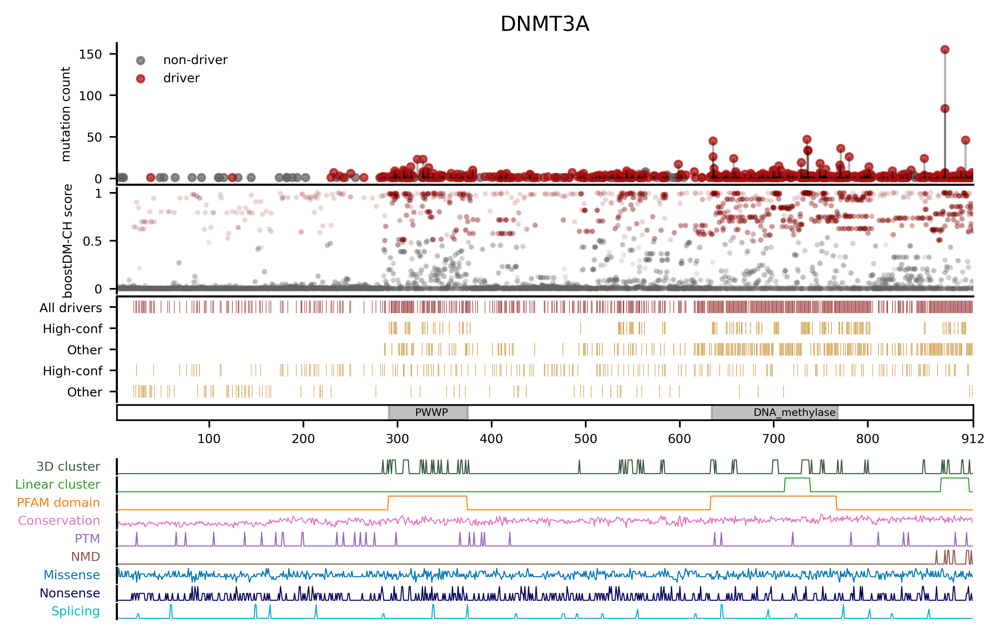

In [28]:
plot_blueprint_fig2('DNMT3A', 'CH')

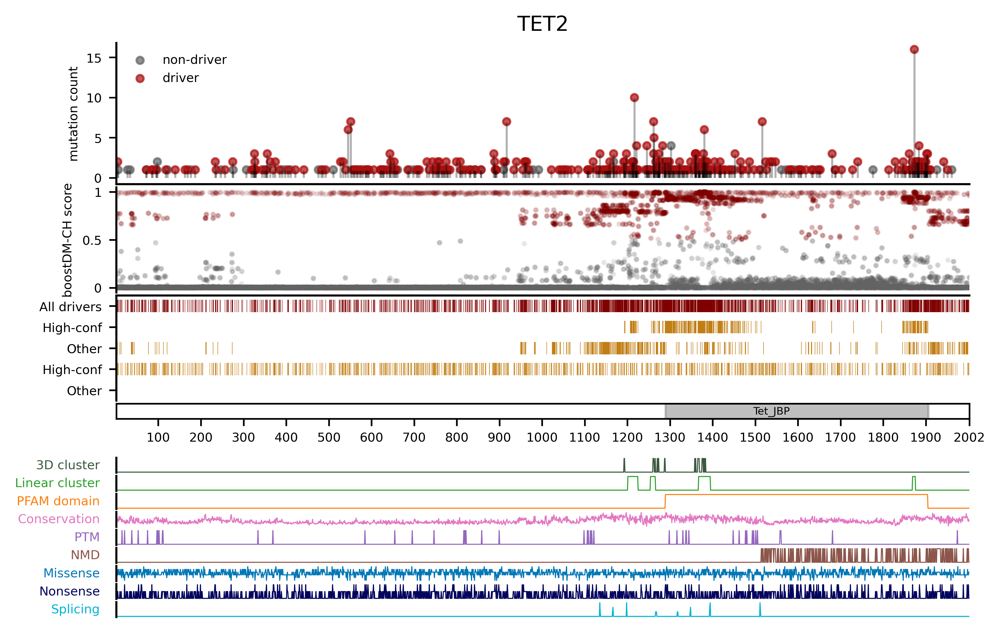

In [29]:
plot_blueprint_fig2('TET2', 'CH')

# SHAP values

In [21]:
features = ["shap_CLUSTL_SCORE","shap_CLUSTL_cat_1","shap_HotMaps_cat_1",
            "shap_smRegions_cat_1","shap_csqn_type_missense","shap_csqn_type_nonsense",
            "shap_csqn_type_splicing","shap_PhyloP", "shap_Acetylation","shap_Phosphorylation",
            "shap_Regulatory_Site","shap_Ubiquitination","shap_Methylation","shap_nmd"]


names_features = {
    'shap_nmd': 'NMD',
    'shap_CLUSTL_int': 'Linear cluster',
    'shap_HotMaps_cat_1': '3D cluster',
    'shap_smRegions_cat_1': 'PFAM domain',
    'shap_PTM_int': 'PTM',
    'shap_PhyloP': 'Conservation',
    'shap_csqn_type_missense': 'Missense',
    'shap_csqn_type_splicing': 'Splicing',
    'shap_csqn_type_nonsense': 'Nonsense'}


def plot_radar_single_mutation(gene, mutation, feature, values, drivers, label, predicted=True):
    
    radar_color = "#a64040ff"
    if not predicted:
        drivers = np.logical_not(drivers)
        radar_color = "grey"
    
    # Definition of variables 
    
    fig = plt.subplots(figsize=(2.,2.), dpi=600)
    degron = "_GLOBAL_VALUE"

    N = len(feature)

    # What will be the angle of each axis in the plot? (we divide the plot / number of variable)
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]
    
    # Initialise the spider plot
    ax = plt.subplot(111, polar=True)
    ax.spines['polar'].set_visible(False)
    
    maxv = int(np.amax(values))+1
    minv = int(np.amin(values))-1
    
    # If you want the first axis to be on top:
    ax.set_theta_offset(pi / 2)
    ax.set_theta_direction(-1)
    ax.vlines(angles[:-1], minv, [3 for x in range(len(angles[:-1]))], 
              colors="#666666", 
              zorder=3,
              linewidth=0.5,
              alpha=0.5) 
    
    # Draw ylabels
    ax.set_rlabel_position(0)
    plt.ylim(minv,maxv)
    plt.yticks(np.arange(minv,maxv+1,1), np.arange(minv,maxv+1,1), color="black", size=7)
#     values +=  values[:1]
    # y axis lines
    for x in range(minv+1, maxv):
        yaxiss = [x]*N
        yaxiss += yaxiss[:1]
        ax.plot(angles, yaxiss, linewidth=0.2, linestyle='solid', color='grey')

    
    # Mutation
    values_true = values[drivers]
    list(compress(list(values), list(drivers)))
    # plot each value
    for case in values_true:
        case = list(case)
        case += case[:1]
        ax.plot(angles, case, linewidth=0.9, linestyle='solid', label=drivers, color=radar_color)
    
    ax.grid(visible=None,axis="x")
    ax.grid(visible=None, axis="y",lw=0.25, color='w')
    
    # Title
#     plt.title(f'{label} (N={sum(drivers)})')
    plt.title(f'{label}', size=8)

    
    # Draw one axe per variable + add labels labels yet
    ax.tick_params(axis='x', which='major', pad=10)
    _=plt.xticks(angles[:-1], [names_features[x] for x in feature], fontsize=6)
    for i, value in enumerate(values[0]):
        if value >= 0.7:
            ax.get_xticklabels()[i].set_fontweight("bold")
            ax.get_xticklabels()[i].set_fontsize(7)
    plt.show()

In [22]:
def radar_satmutagenesis_single(gene, mutation):
    muts_satmut = pd.read_csv(path_saturation+ gene + '.CH.prediction.tsv.gz', sep="\t")
    muts_satmut = muts_satmut[muts_satmut['aachange']==mutation]
    values = muts_satmut[features]
    values['shap_CLUSTL_int'] = muts_satmut['shap_CLUSTL_SCORE']+muts_satmut['shap_CLUSTL_cat_1']
    values['shap_PTM_int'] = muts_satmut['shap_Acetylation']+muts_satmut['shap_Phosphorylation']+\
                            muts_satmut['shap_Regulatory_Site']+muts_satmut['shap_Ubiquitination']+\
                            muts_satmut['shap_Methylation']
    feature = ['shap_CLUSTL_int', 'shap_HotMaps_cat_1', 'shap_smRegions_cat_1', 'shap_csqn_type_missense',
                'shap_csqn_type_nonsense', 'shap_csqn_type_splicing', 'shap_PhyloP', 'shap_PTM_int', 'shap_nmd']
    values = values[feature].values
    drivers = muts_satmut["boostDM_class"].values
    plot_radar_single_mutation(gene, mutation, feature, values, drivers, 'Explanation '+gene.split('.')[0]+'-'+mutation, predicted=True)

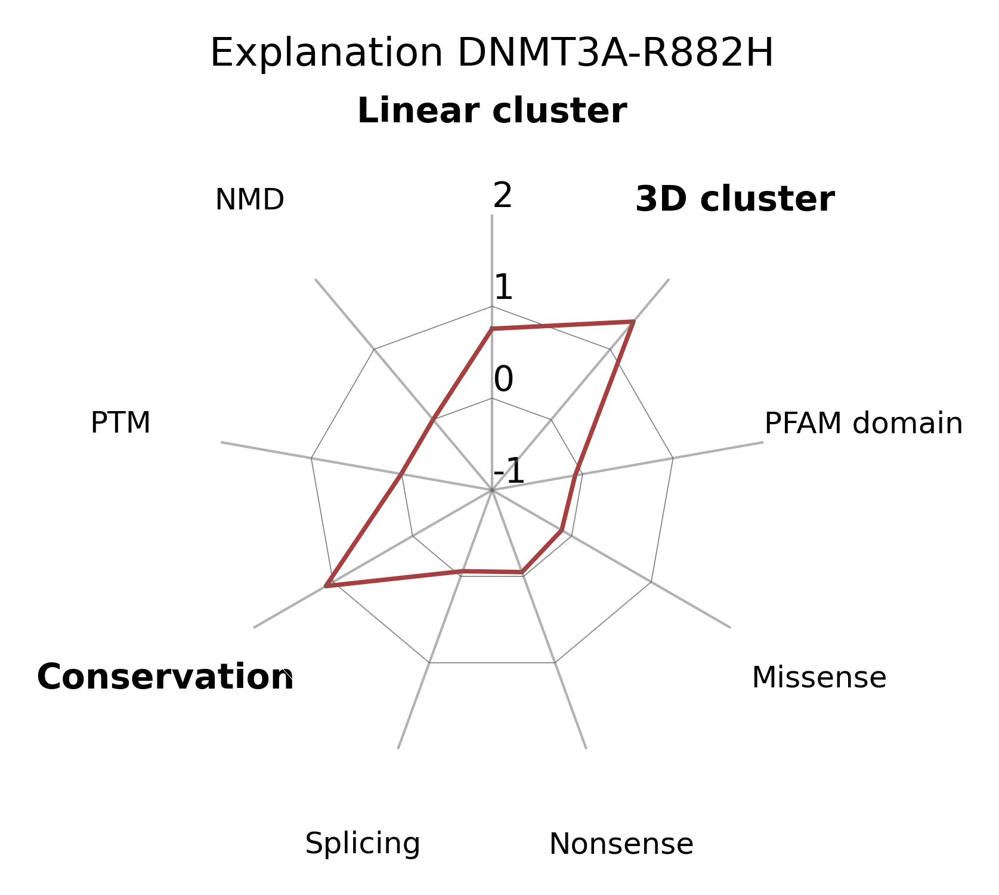

In [23]:
radar_satmutagenesis_single('DNMT3A', 'R882H')

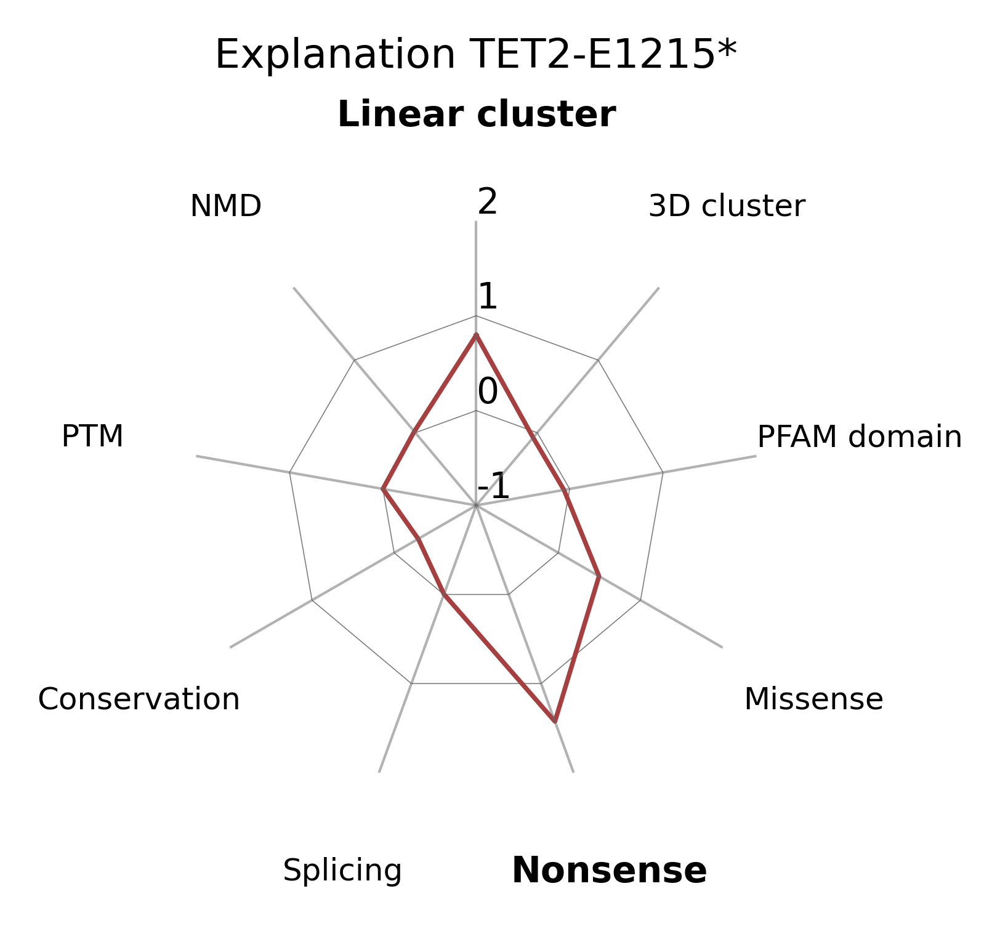

In [24]:
radar_satmutagenesis_single('TET2', 'E1215*')

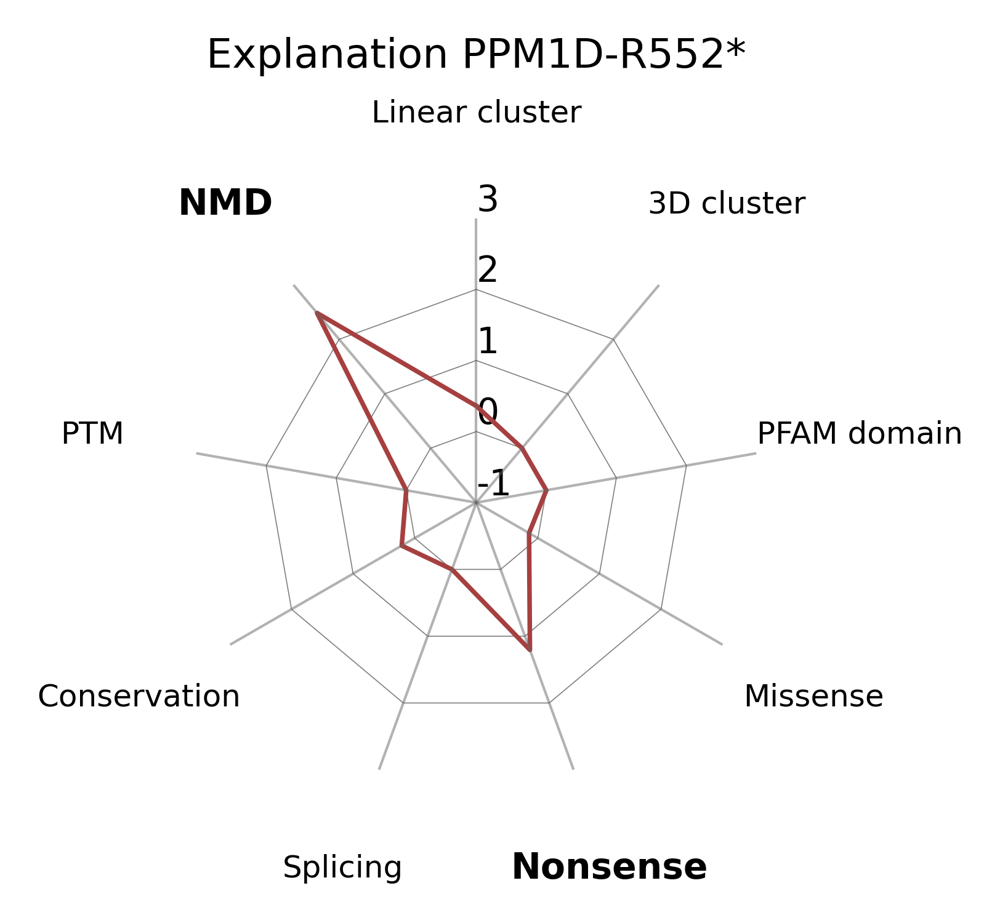

In [25]:
radar_satmutagenesis_single('PPM1D', 'R552*')

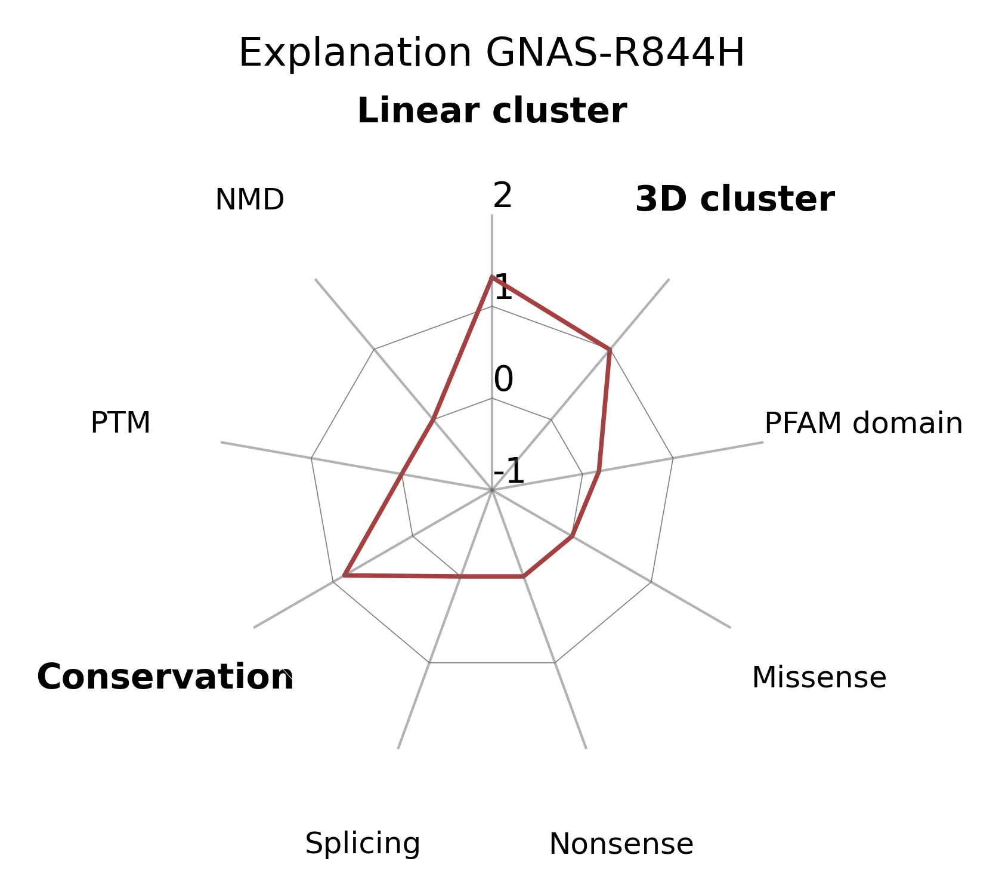

In [26]:
radar_satmutagenesis_single('GNAS', 'R844H')

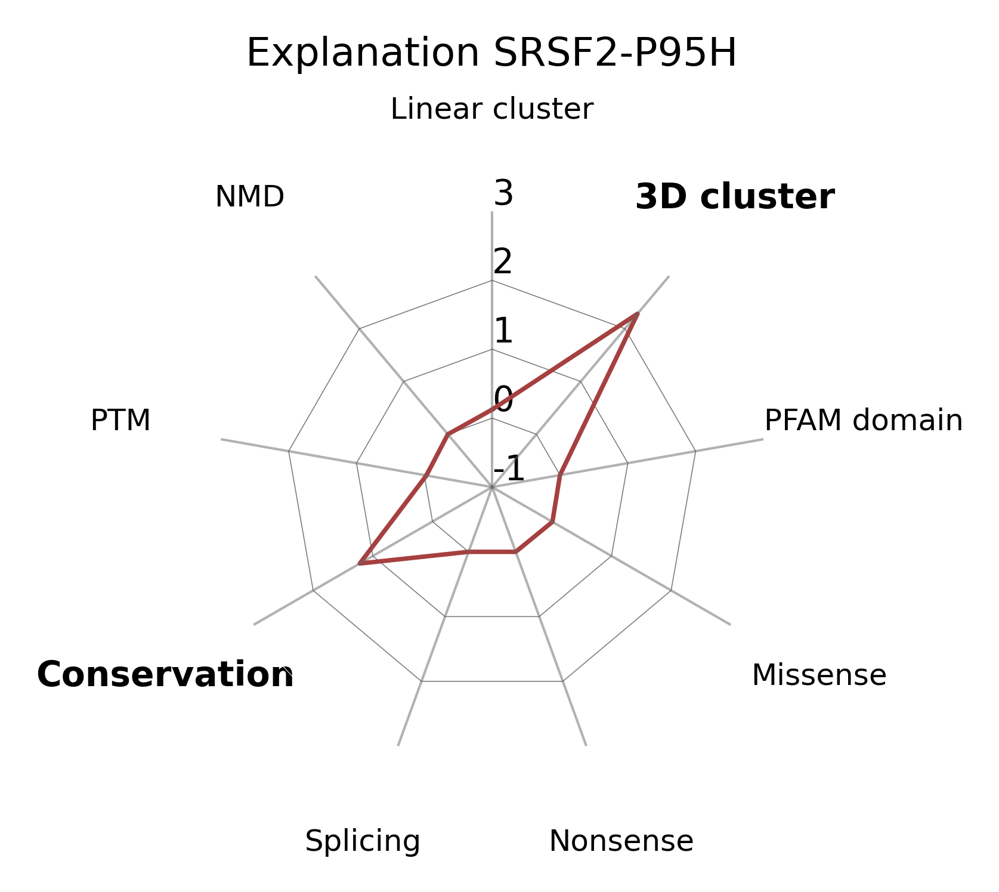

In [27]:
radar_satmutagenesis_single('SRSF2', 'P95H')